In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [ ]:
import torch
import os
from IPython.display import Image, clear_output #image display
print(f"setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

setup complete. Using torch 1.13.1+cu116 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
#environment(variable) setup
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
rf = Roboflow(api_key="**************")
project = rf.workspace().project("thumbs-up-down-ce02c")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/thumbs-up-down-1 in yolov5pytorch:: 100%|██████████| 204/204 [00:00<00:00, 1366.35it/s]


In [ ]:
#custom train yolov5 model
train.py --img 500 --batch 15 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/datasets/thumbs-up-down-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=15, imgsz=500, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-119-g5543b89 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, h

In [ ]:
#evaluate yolov5 performance
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
#trained weight inference
!python detect.py --weights runs/train/exp/weights/best.pt --img 500 --conf 0.1 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/thumbs-up-down-1/valid/images, data=data/coco128.yaml, imgsz=[500, 500], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-119-g5543b89 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [500, 500] must be multiple of max stride 32, updating to [512, 512]
image 1/8 /content/datasets/thumbs-up-down-1/valid/images/WIN_20230311_02_39_24_Pro_jpg.rf.ad5e3c58747c0dda36f7d573af56a2e7.jpg: 512x512 1 thumbs up, 8.9ms
image 2/8 /content/datasets/thumbs-up-down-1/valid/images/WIN_20230311_0

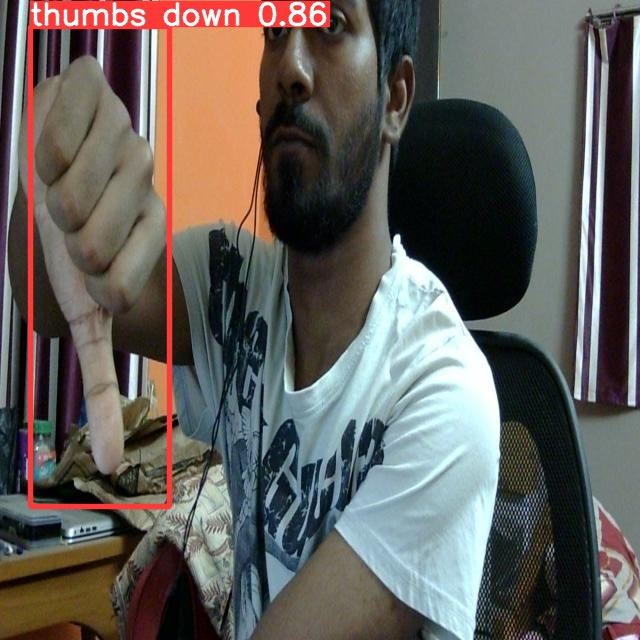

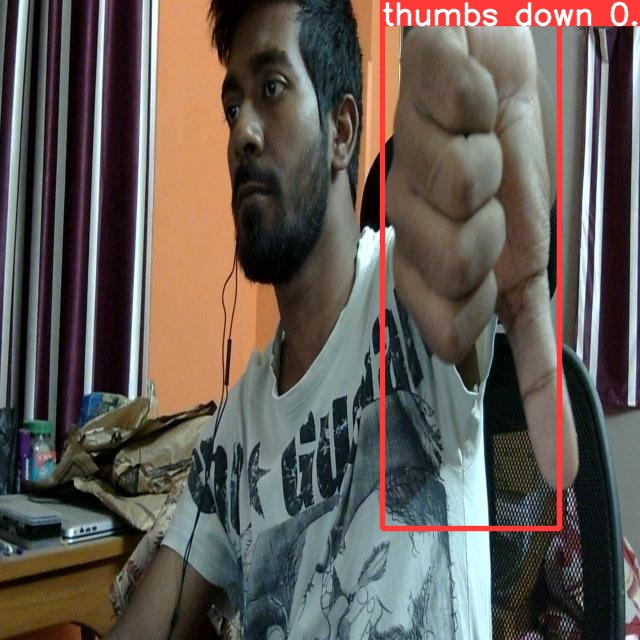

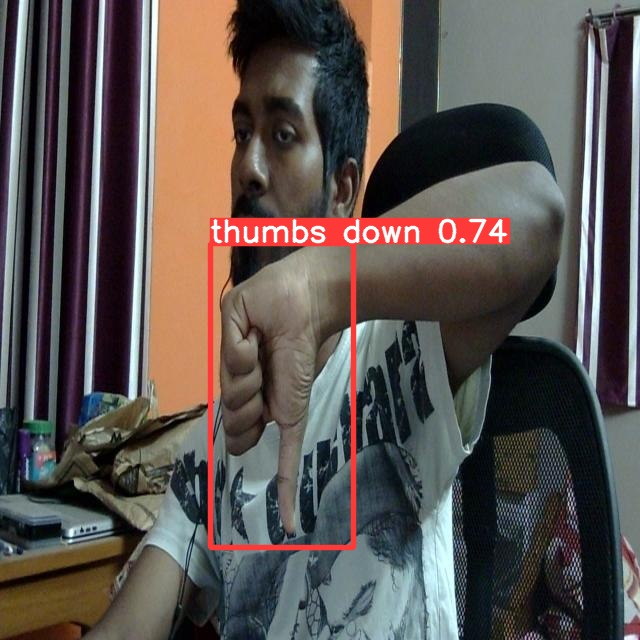

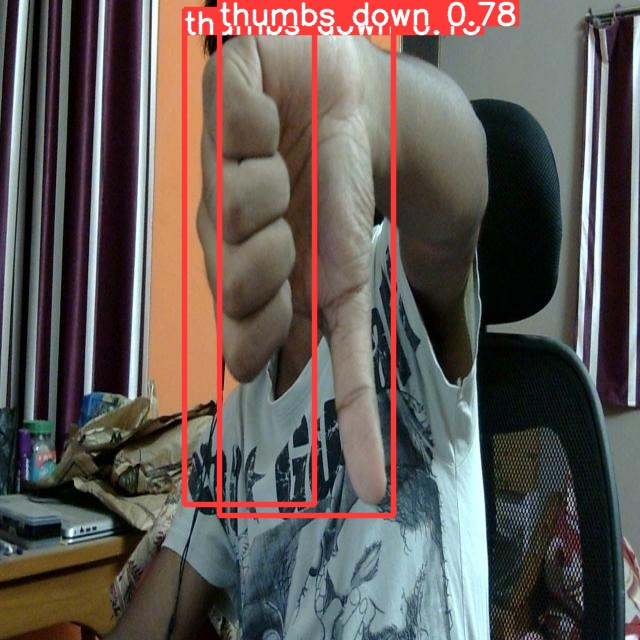

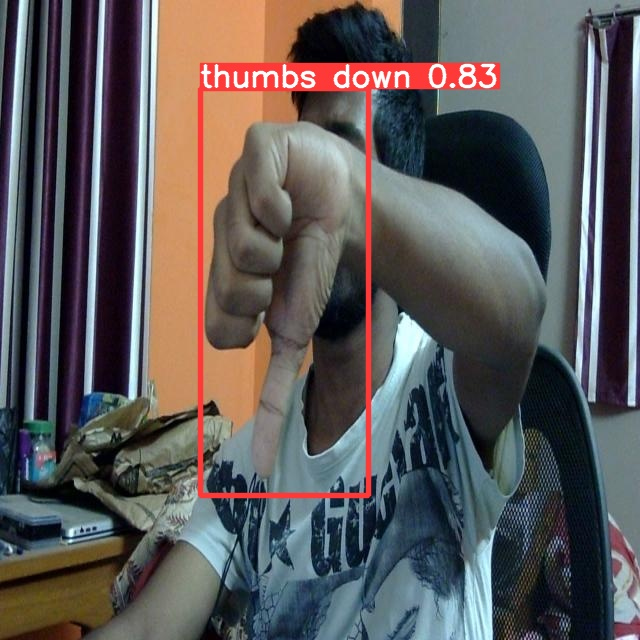

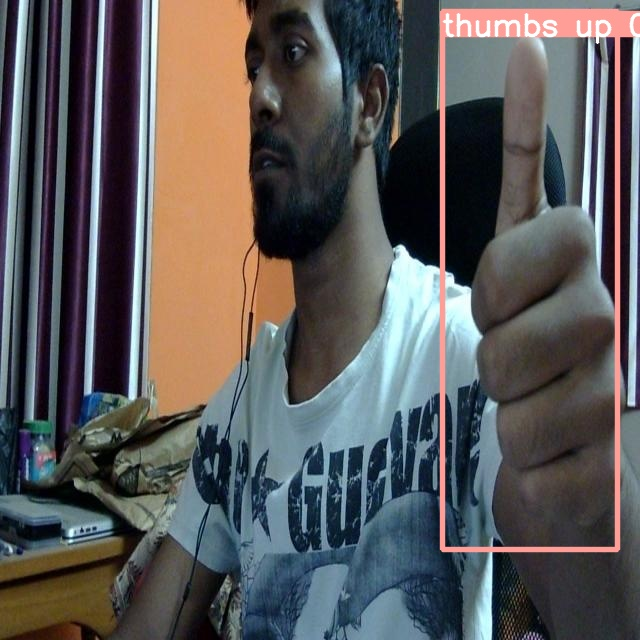

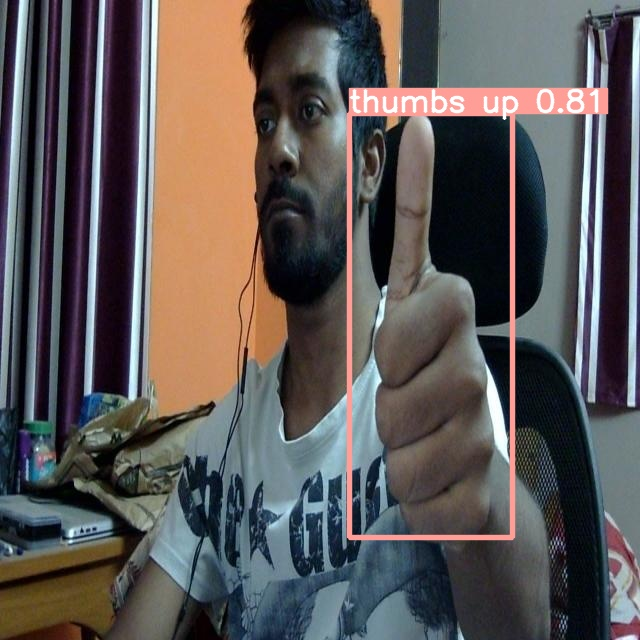

In [ ]:
#inference on test all images(8 test images)
import glob
from IPython.display import Image, display

i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i += 1
  if i < 8:
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#download trained models(best/last)
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
%pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2

**Real time detection**

*(Need to run on a local machine for detection)*

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source 0